In [1]:
import torch
from torch.autograd import Variable
import numpy as np
import pylab as plt
%matplotlib inline
import torchvision.utils as vutils
import glob
import tensorflow as tf

In [2]:
import sys
sys.path.append('../')
import models
import models.mnist
from data import get_loaders
from main import DictWrapper

In [3]:
%load_ext autoreload
%autoreload 1

In [20]:
%aimport log_plotter
from log_plotter import get_run_names, get_data, get_data_pth, plot_smooth, plot_tag, plot_runs_and_tags

* bug fix: 2 times schedule.update(), reproducing linrank results with expsnooze_th, noisy touch_p that makes sense.
* inc versions are worse

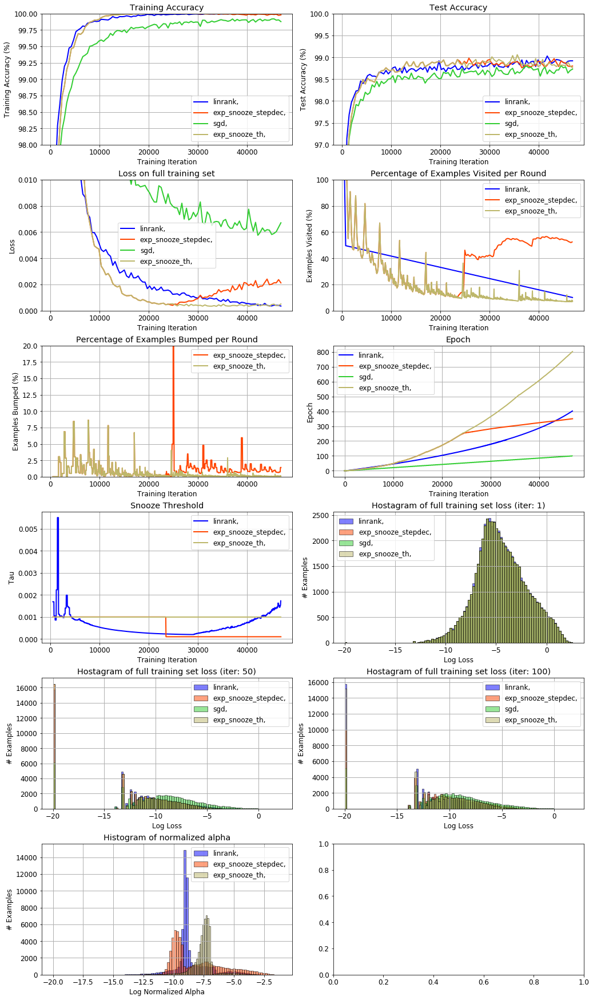

In [106]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist/']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100', 'alpha_normed_h_log']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.01], [0, 100], [0, 20], None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

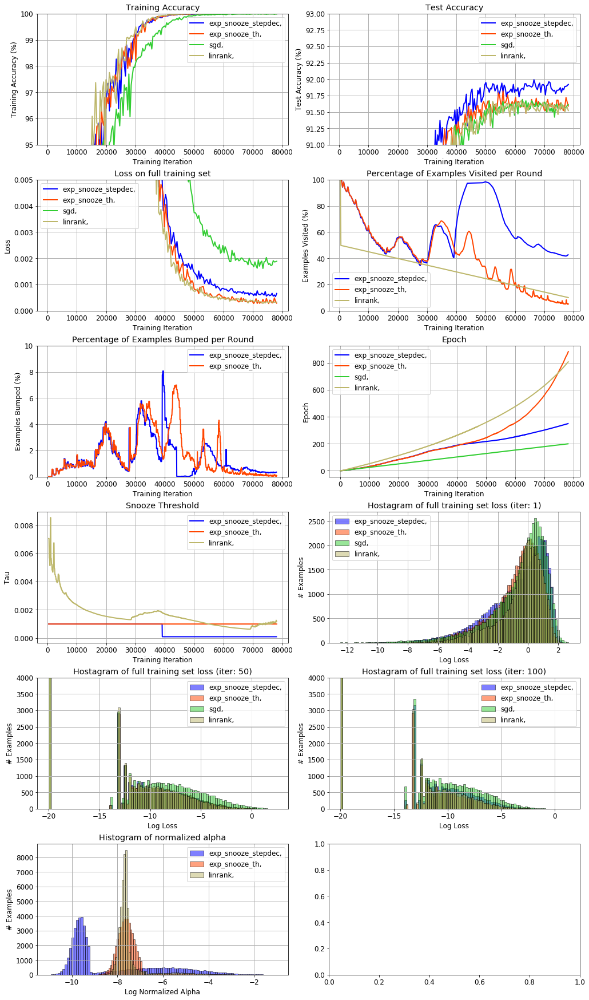

In [107]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_expsnooze_ad_hist/']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100', 'alpha_normed_h_log'] # 'lr_Nex'] # 'loss', 'epoch', 'touch_p', 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/cifar10_expsnooze_ad_hist.png'
lg_tags = ['sgd', 'linrank,', 'exp_snooze']  # 'w2c_'  # , 'params_.......' , 'wnoise'
ylim = [[95, 100], [91, 93], [0, 0.005], [0, 100], [0, 10], None, None, None, [0, 4000], [0, 4000], None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

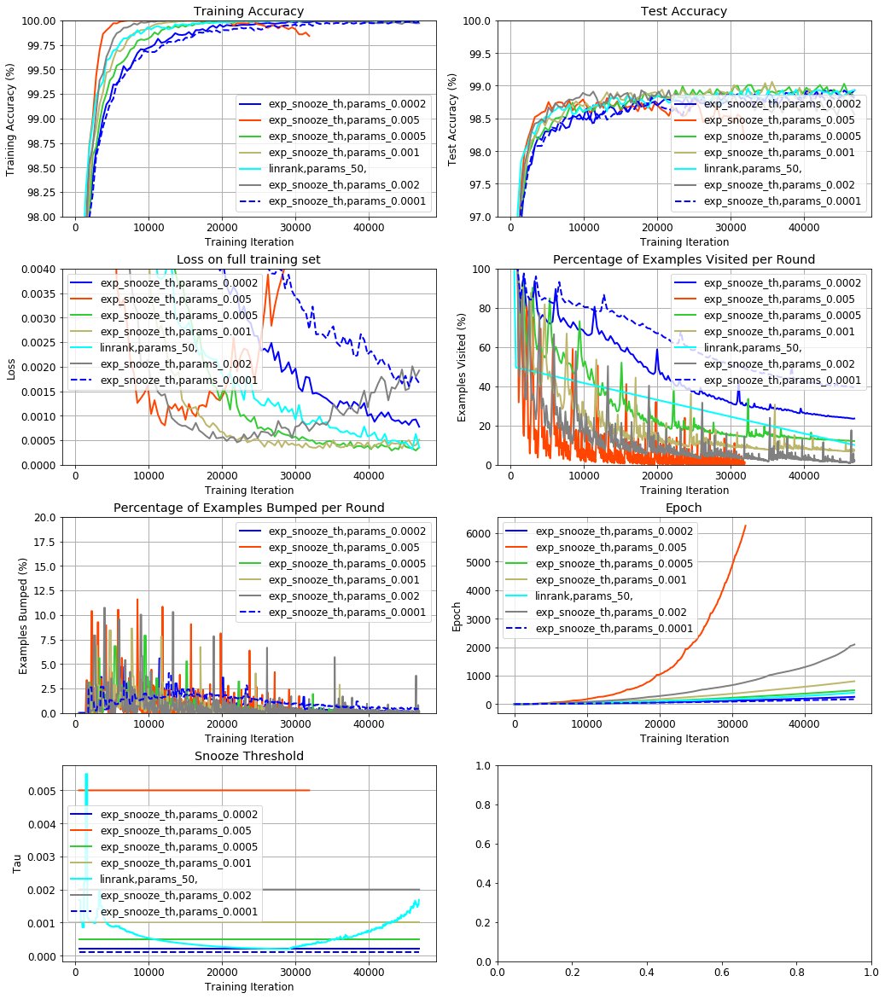

In [159]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* if using norm=sum, tau should be 1/bs which means continue until all examples have equal loss. 1/128~=0.001, so something close to this from below should work fine which is what we see here.
* 0.001 is best with dmom=0.9, while lower values work best with dmom=0 or dmom=0.5 highest
* 0.0001 and dmom=0.0 reaches the lowest train error of all.

In [154]:
1/128.

0.0078125

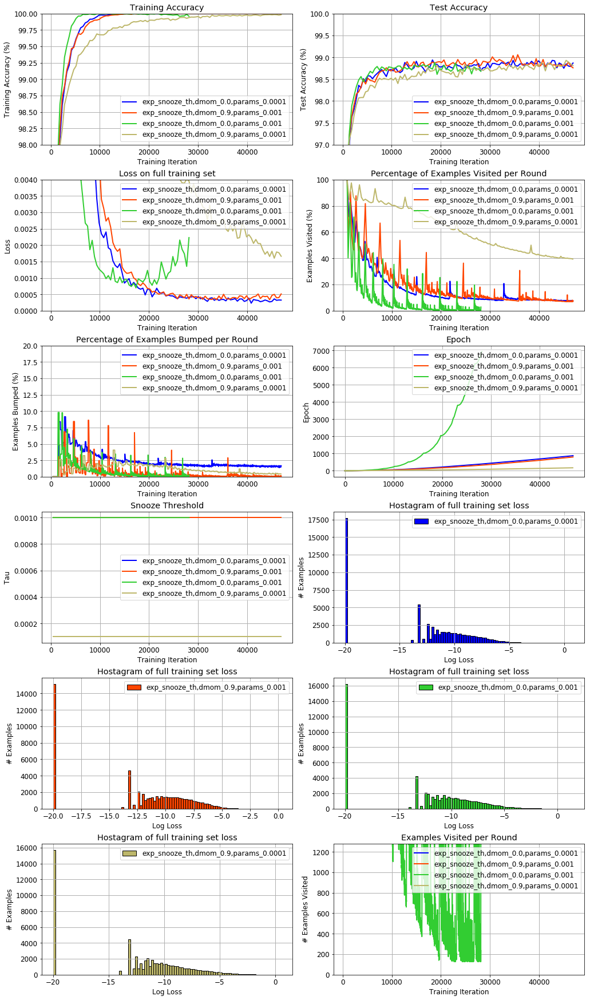

In [158]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_(0.0|0.9),.*norm_sum.*exp_snooze.*params_0.000?1']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log', 'touch']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, [0, 1280]]
sep_h = True
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

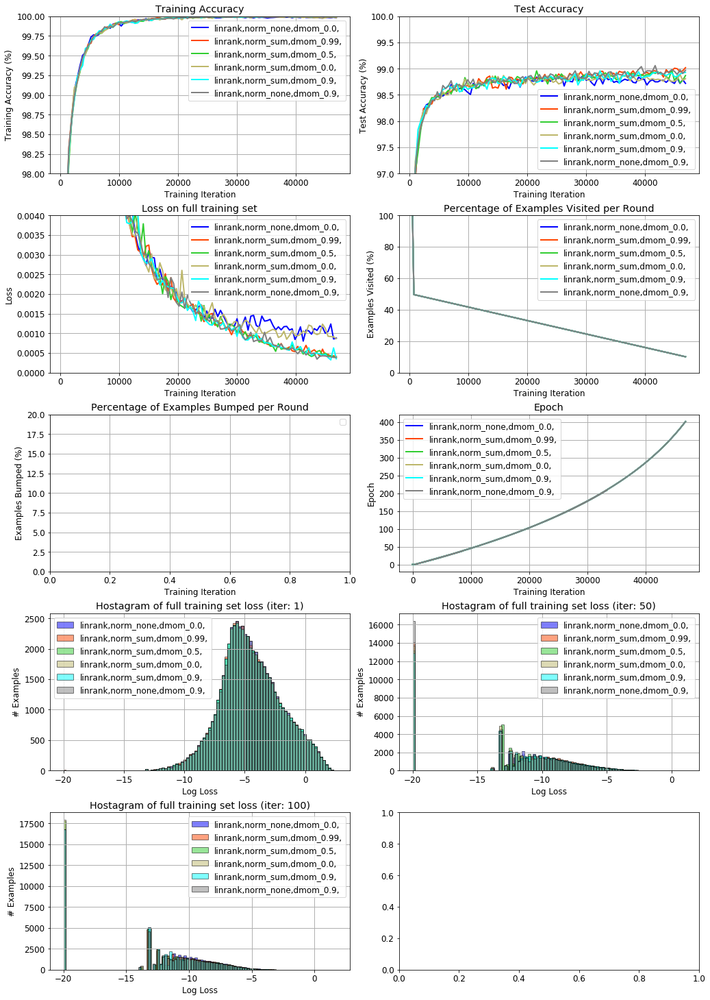

In [190]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam/.*linrank']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'norm_', 'dmom_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* there are faster ones but they would go crazy later in the training
* hence the idea of tau_std

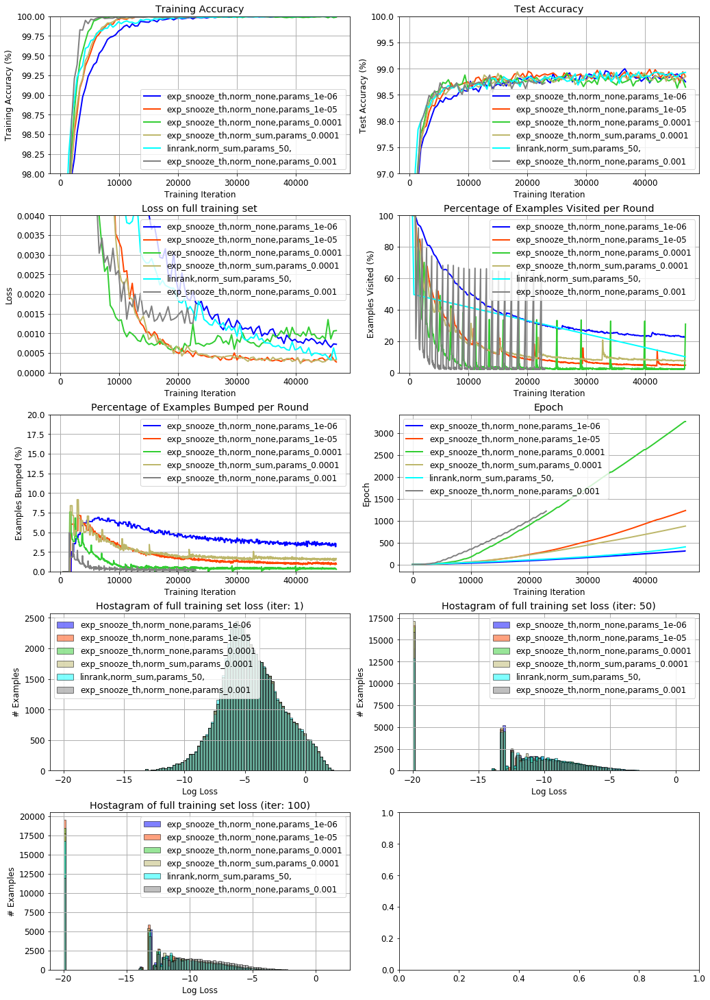

In [192]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam/(.*dmom_(0.0),.*norm_none.*exp_snooze.*params_|.*dmom_0.0,.*norm_sum.*exp_snooze.*params_0.0001|.*dmom_0.9,.*norm_sum.*linrank)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'norm_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* tau std doesn't work, at least the simple version.
* tau on log doesn't work either
* tau dropping only small works great, better than fixed th
* dmom=0 can reach the lowest loss, but norm doesn't matter.

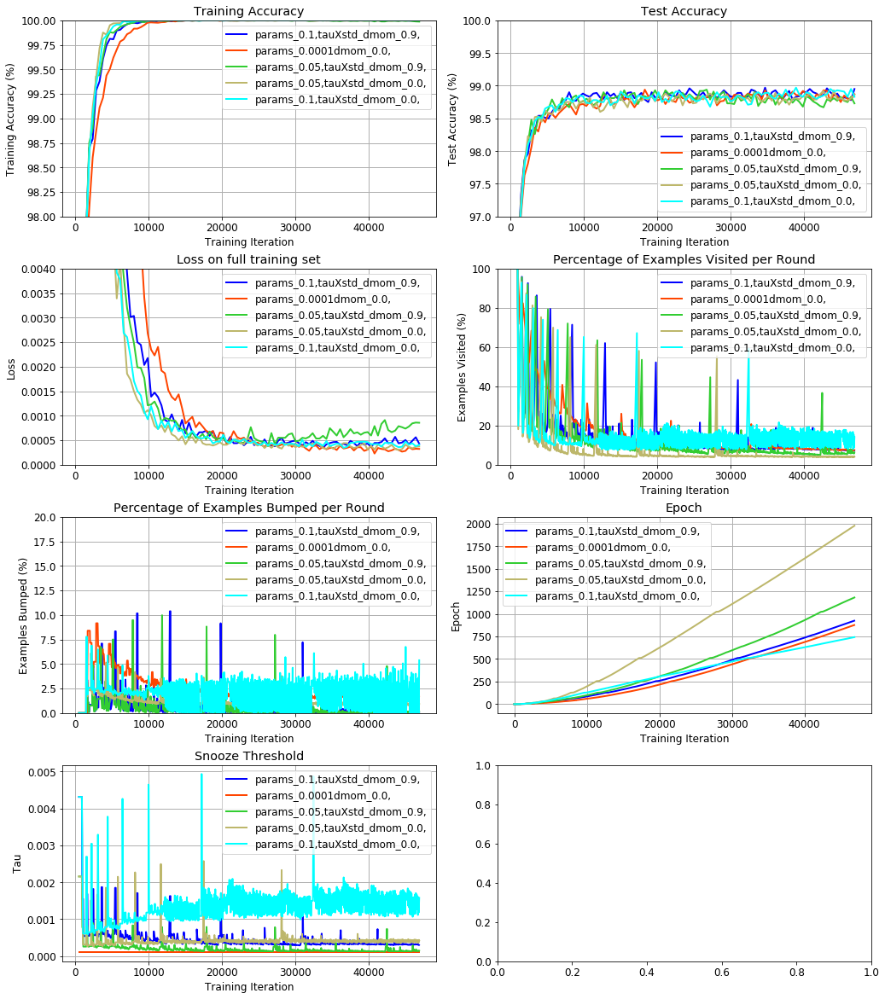

In [278]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam/(.*dmom_.*norm_sum.*params_(0.1|0.05).*tauXstd|.*dmom_0.0,.*norm_sum.*exp_snooze.*params_0.0001)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['params_', 'tauXstd', 'dmom_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

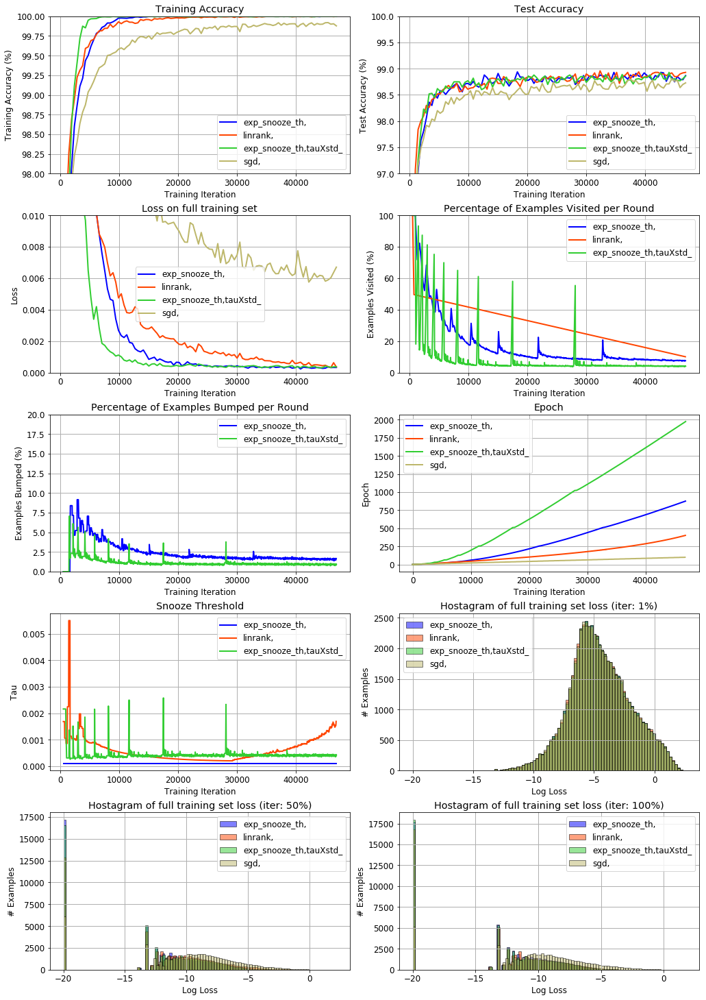

In [322]:
get_data_f = get_data_pth
# plot_f = plt.plot
plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam/(.*dmom_0.0.*norm_sum.*params_0.05.*tauXstd|.*dmom_0.0,.*norm_sum.*exp_snooze.*params_0.0001|.*dmom_0.9,.*norm_sum.*linrank)|.*runs_mnist_expsnooze_ad_hist/.*sgd']  # |.*dmom_0.9,.*norm_sum.*exp_snooze.*params_0.001
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'tauXstd']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.01], [0, 100], [0, 20], None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

## MNIST Summary
* none of the adaptive versions worked, so I ended up with expsnooze_th
* norm doesn't matter
* dmom=0 is better

# cifar10

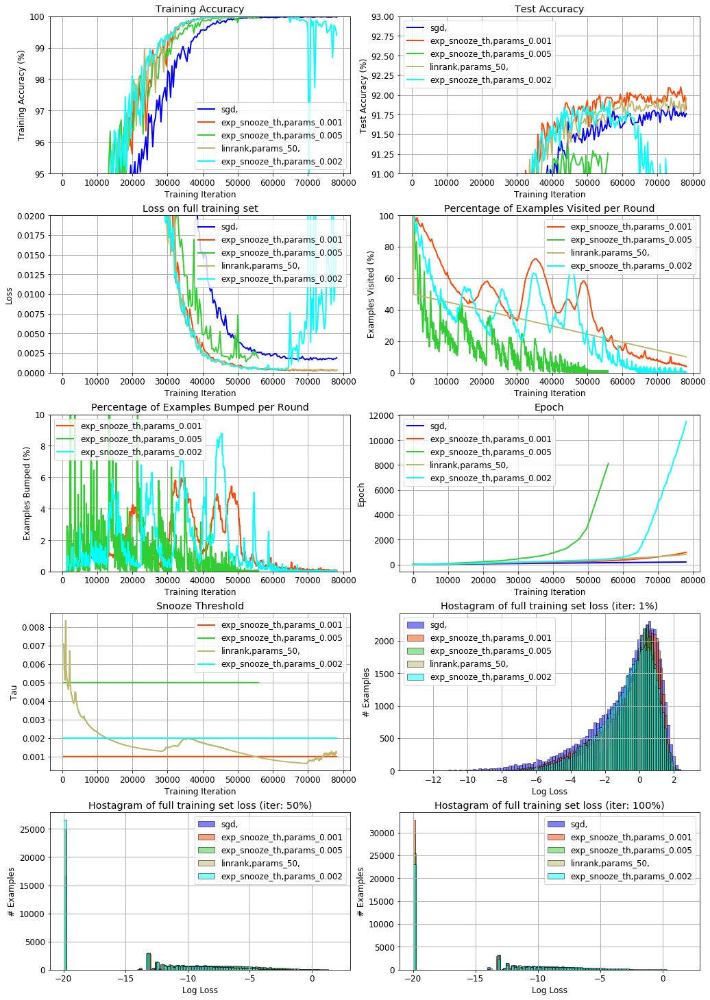

In [320]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_expsnooze_ad_hist_hparam/(.*dmom_0.9.*params_0.0(?!.*tauXstd)|.*dmom_0.9,.*linrank|.*sgd)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/cifar10_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'tauXstd', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[95, 100], [91, 93], [0, 0.02], [0, 100], [0, 10], None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

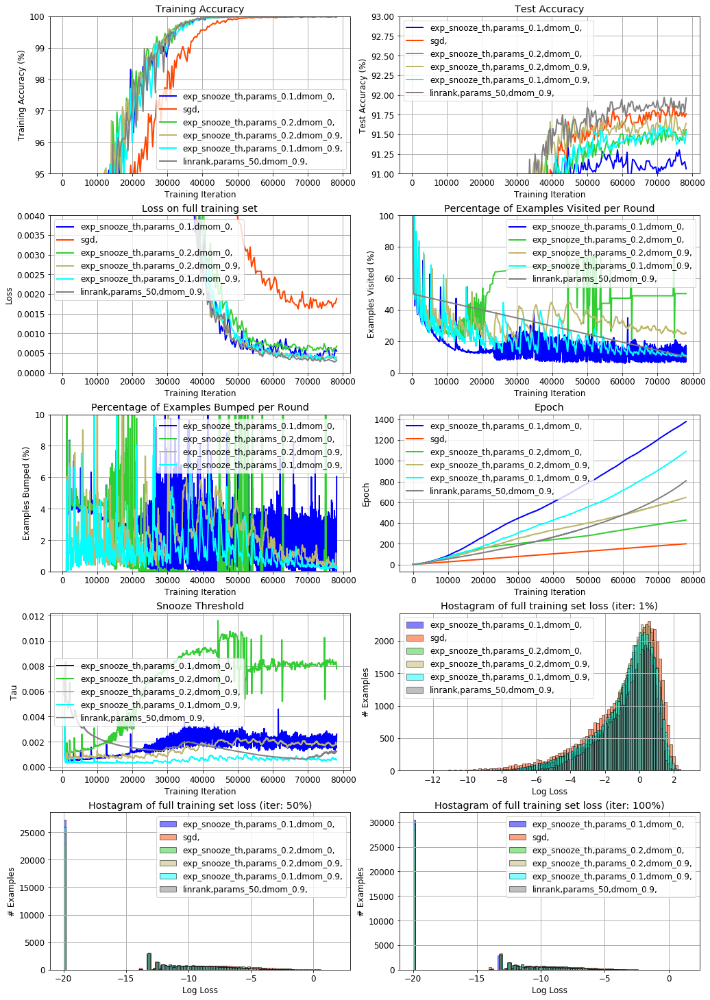

In [318]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_expsnooze_ad_hist_hparam/(.*dmom_0.*params_0.(1|2).*tauXstd|.*dmom_0.9,.*linrank|.*sgd)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/cifar10_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'params_', 'dmom_']  # 'w2c_', , 'params_.......'
ylim = [[95, 100], [91, 93], [0, 0.004], [0, 100], [0, 10], None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

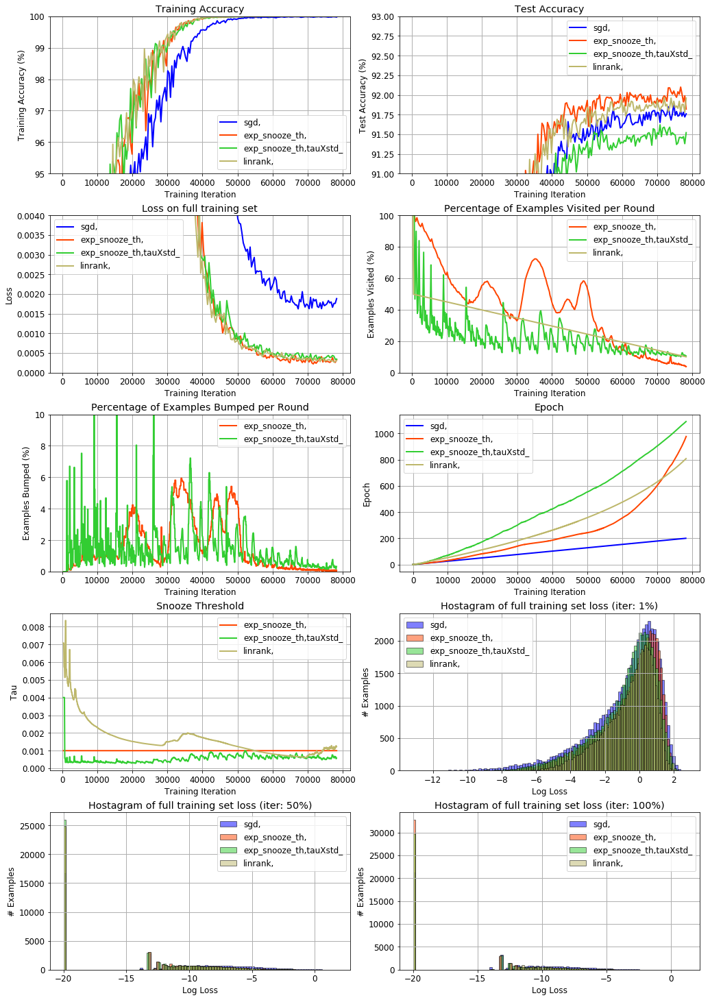

In [329]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_expsnooze_ad_hist_hparam/(.*dmom_0.9.*params_0.001(?!.*tauXstd)|.*dmom_0.9.*params_0.1.*tauXstd|.*dmom_0.9,.*linrank|.*sgd)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/cifar10_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'tauXstd']  # 'w2c_', , 'params_.......'
ylim = [[95, 100], [91, 93], [0, 0.004], [0, 100], [0, 10], None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

## Cifar10 summary
* dmom is needed with fixed th on cifar10 and helps with tauXstd to stabilize and reach lower loss
* as expected, fixed th has a narrower range of accepatble values
* tauXstd is more flexible

# SVHN

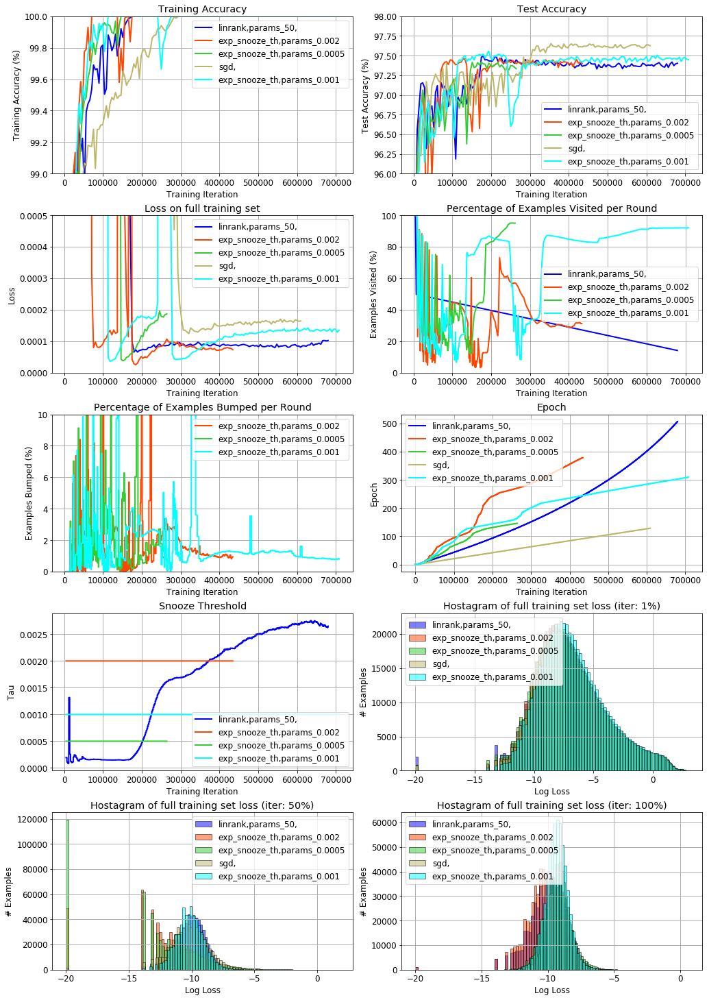

In [335]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_svhn_expsnooze_ad_hist_hparam/((?!.*tauXstd)|.*sgd|.*linrank)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/svhn_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'tauXstd', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[99, 100], [96, 98], [0, 0.0005], [0, 100], [0, 10], None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

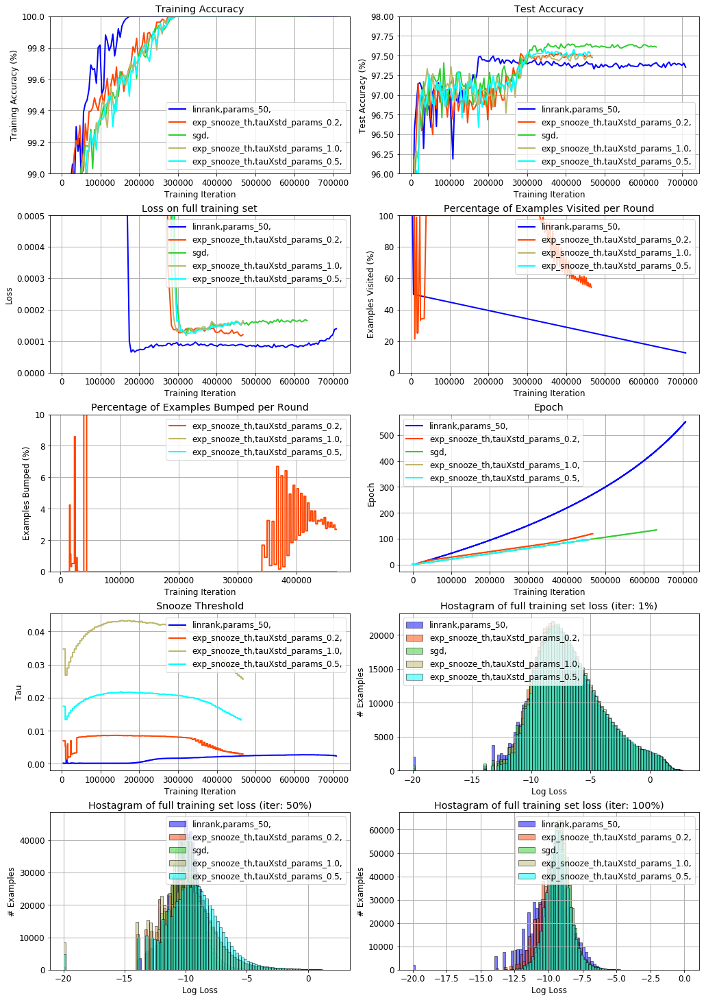

In [342]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_svhn_expsnooze_ad_hist_hparam/(.*tauXstd|.*sgd|.*linrank)']
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/svhn_expsnooze_ad_hist_hparam.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd,', 'linrank', 'exp_snooze', 'tauXstd', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[99, 100], [96, 98], [0, 0.0005], [0, 100], [0, 10], None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* It's the log loss that's gaussian. not the loss
* plotted tau should have been mu-tau

# Log loss

* tauXstdL on log loss lowers the threshold a lot
* cumsum is too bumpy, and it is basically tauXmean
* tauX doesn't make sense because I know I can get rid of 90% of the data. So the intuition to get rid of the bottom percentile doesn't work.
* when norm=sum, tau is in a different scale
* fixed bug norm=none, it was in effect norm=bs

* linrank needs dmom=0.9, even with nonorm
* fixed tau works best with dmom=0., the loss goes up in the end

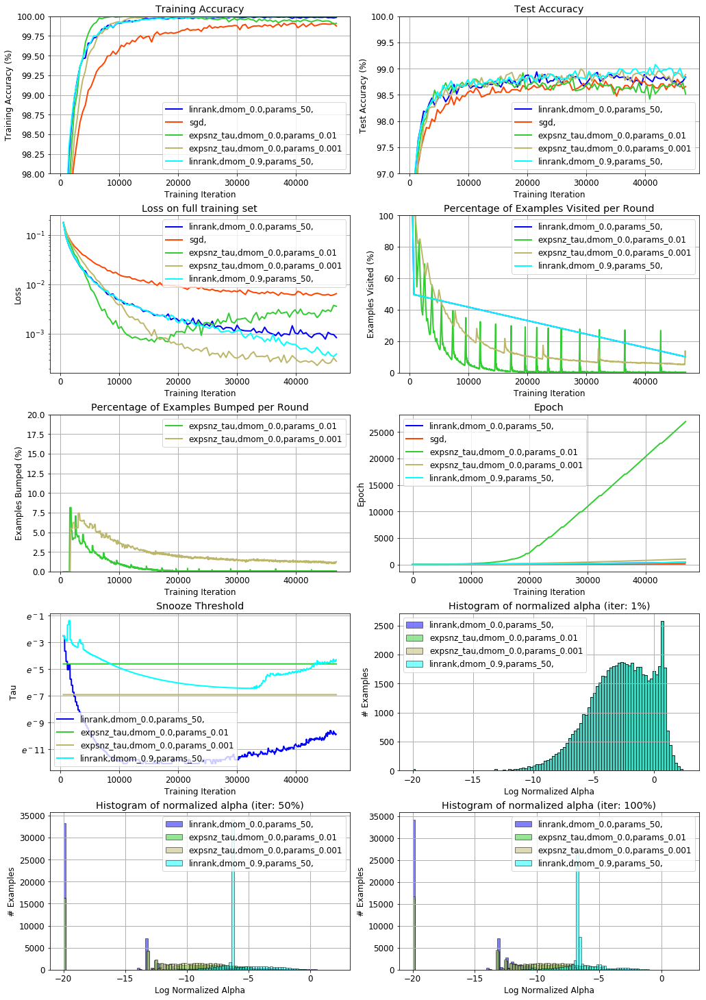

In [492]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.0.*tau,|.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'expsnz', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* tauXstd with dmom=0.9 is much more stable and the threshold curve is smoother and the range of parameters that work well is wider.

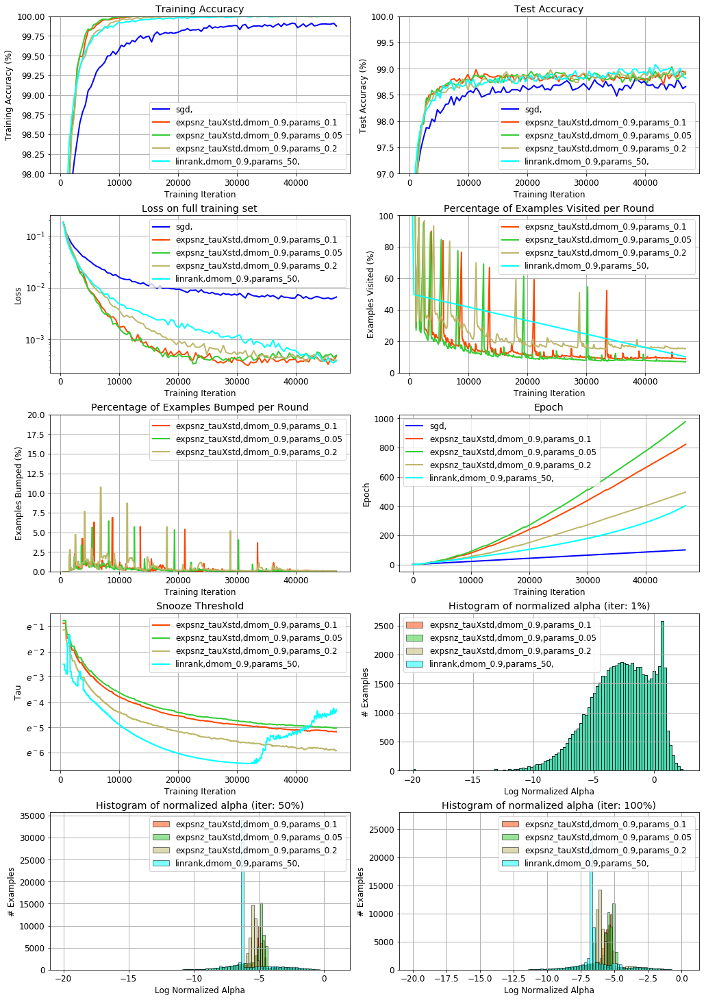

In [488]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.9.*tauXstd,|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'expsnz', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* tauXstdL is not as good as tauXstd but as good as linrank, again dmom=0.9 helps

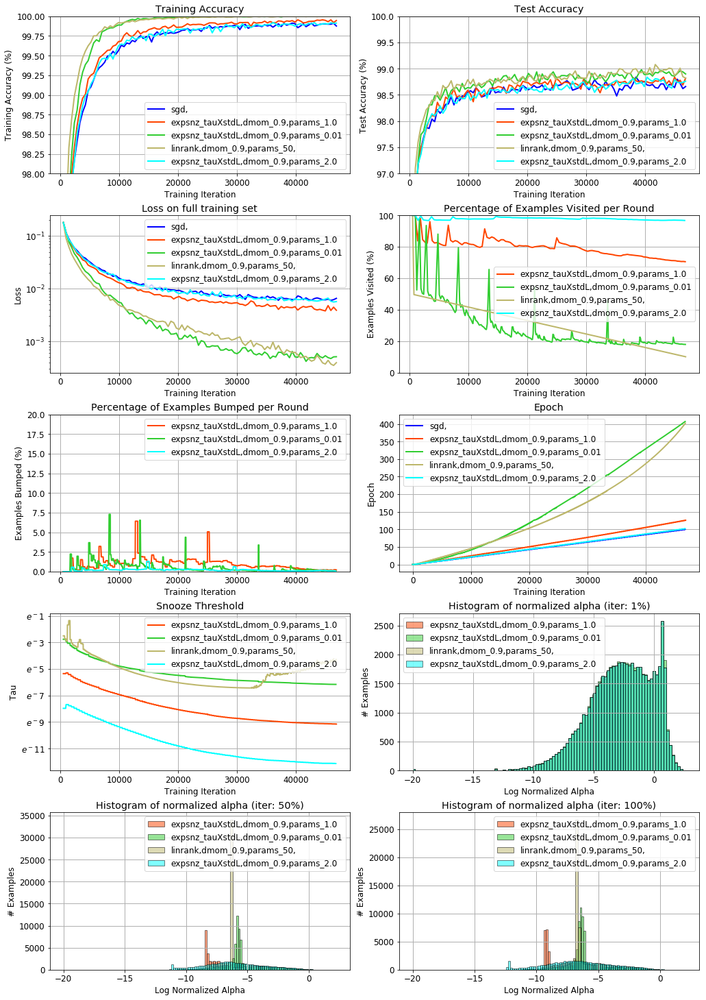

In [496]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.9.*tauXstdL,|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'expsnz', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

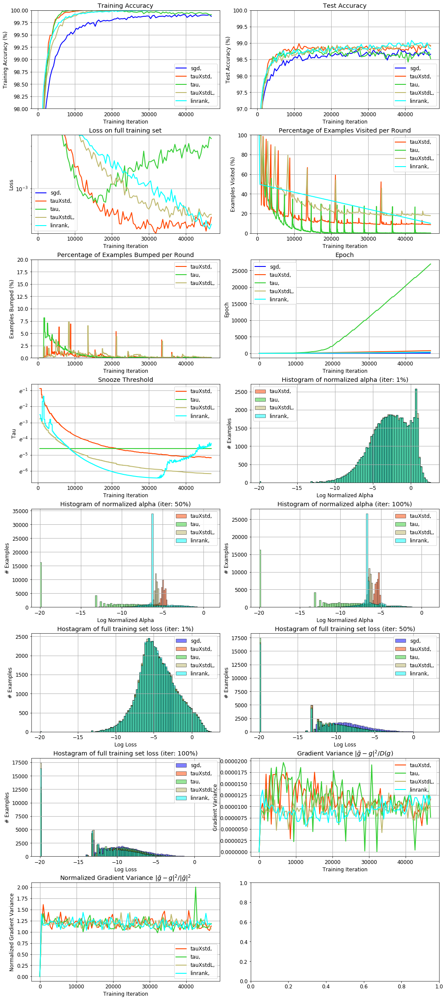

In [610]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_mnist_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.0.*tau,.*params_0.01|.*dmom_0.9.*tauXstd,.*params_0.1|.*dmom_0.9.*tauXstdL,.*params_0.01|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100'  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100', 'grad_var', 'grad_var_n']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/mnist_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'tau']  # 'w2c_', , 'params_.......'
ylim = [[98, 100], [97,100], [0, 0.004], [0, 100], [0, 20], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

## svhn

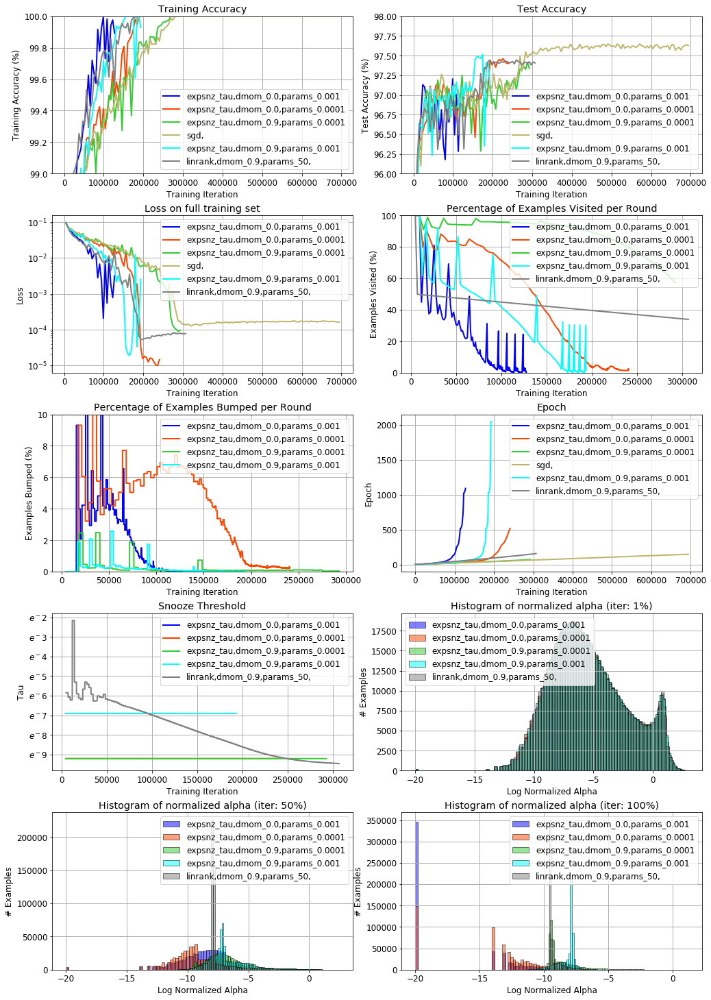

In [500]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_svhn_expsnooze_ad_hist_hparam_nonorm/(.*dmom_.*tau,|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/svhn_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'expsnz', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[99, 100], [96, 98], [0, 0.0005], [0, 100], [0, 10], None, None, None, None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

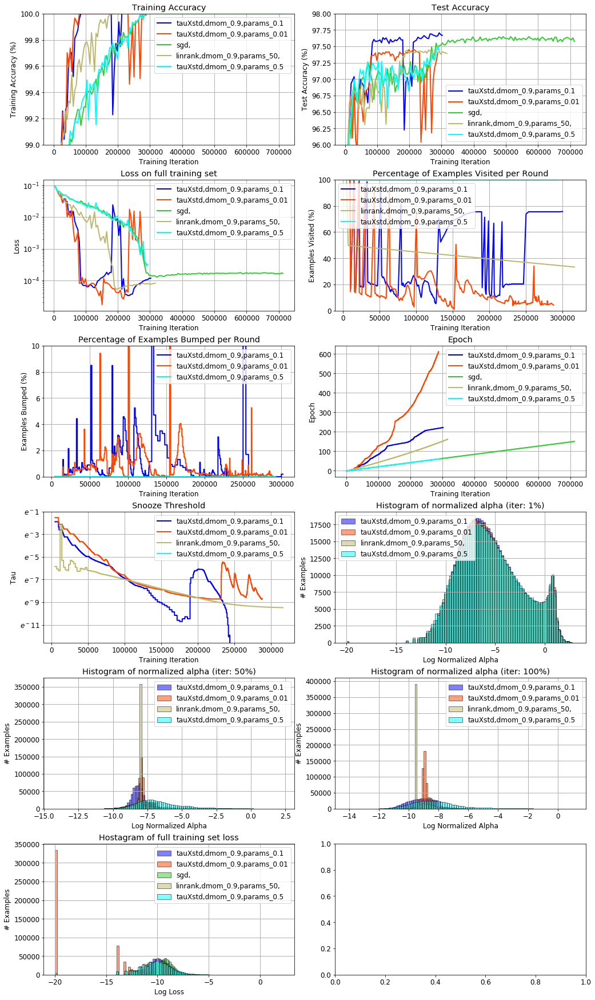

In [508]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_svhn_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.9.*tauXstd,|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100', 'Tloss_h_log']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/svhn_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'tau', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[99, 100], [96, 98], [0, 0.0005], [0, 100], [0, 10], None, None, None, None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

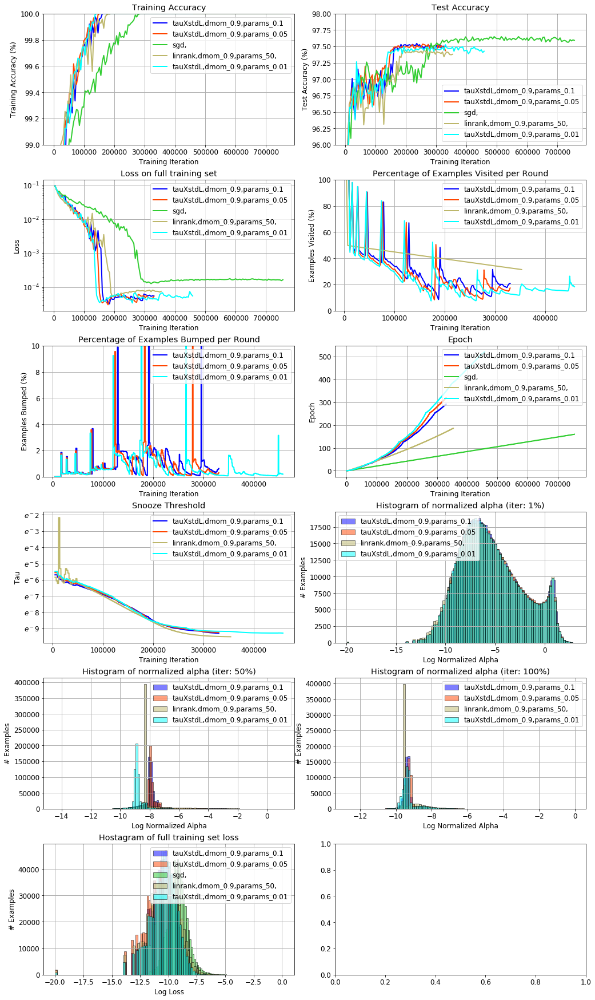

In [514]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_svhn_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.9.*tauXstdL,|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100', 'Tloss_h_log']  # , 'visits_h', 'count_h']
fig_name = 'figs_expsnooze/svhn_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'tau', 'dmom_', 'params_']  # 'w2c_', , 'params_.......'
ylim = [[99, 100], [96, 98], [0, 0.0005], [0, 100], [0, 10], None, None, None, None, None, None, None, None] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

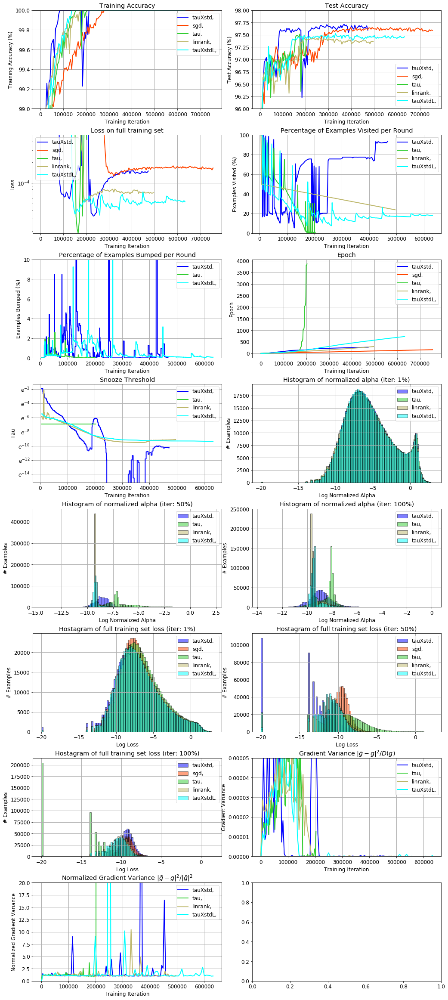

In [604]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_svhn_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.9.*tau,.*params_0.001|.*dmom_0.9.*tauXstd,.*params_0.1|.*dmom_0.9.*tauXstdL,.*params_0.01|.*dmom_0.9.*linrank|.*sgd)']  # |.*runs_mnist_expsnooze_ad_hist_hparam/.*dmom_0.9,.*norm_sum.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100'  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100', 'grad_var', 'grad_var_n']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/svhn_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'tau']  # 'w2c_', , 'params_.......', '/.._', 
ylim = [[99, 100], [96, 98], [0, 0.0005], [0, 100], [0, 10], None, None, None, None, None, None, None, None, [0, 0.00005], [0, 20]] # 0.004
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

* we don't have to go with the fastest if it's going to regret a lot

## cifar10

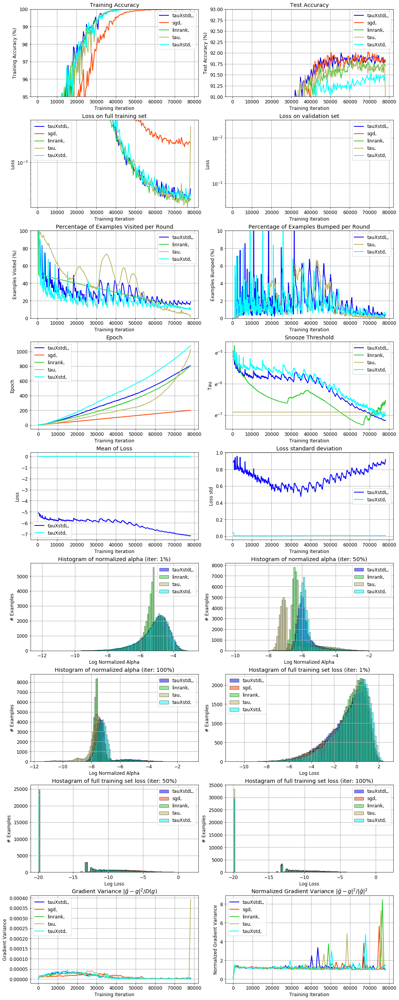

In [636]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_cifar10_expsnooze_ad_hist_hparam_nonorm/(.*dmom_0.9.*tau|.*dmom_0.9.*linrank|.*sgd)']  # .*dmom_0.0.*tau,.*params_0.01|.*dmom_0.9.*tauXstd,.*params_0.1|.*dmom_0.9.*tauXstdL,.*params_0.01|.*dmom_0.9.*linrank
tag_names = ['Tacc', 'Vacc', 'Tloss', 'Vloss', 'touch_p', 'bumped_p', 'epoch', 'tau', 'tauloss_mu', 'tauloss_std', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100'  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100', 'grad_var', 'grad_var_n']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/cifar10_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'linrank', 'tau']  # 'w2c_', , 'params_.......'
ylim = [[95, 100], [91, 93], [0, 0.004], [0, 0.004], [0, 100], [0, 10], None, None, None, None, None, None, None, None, None, None, None, None]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

## Imagenet

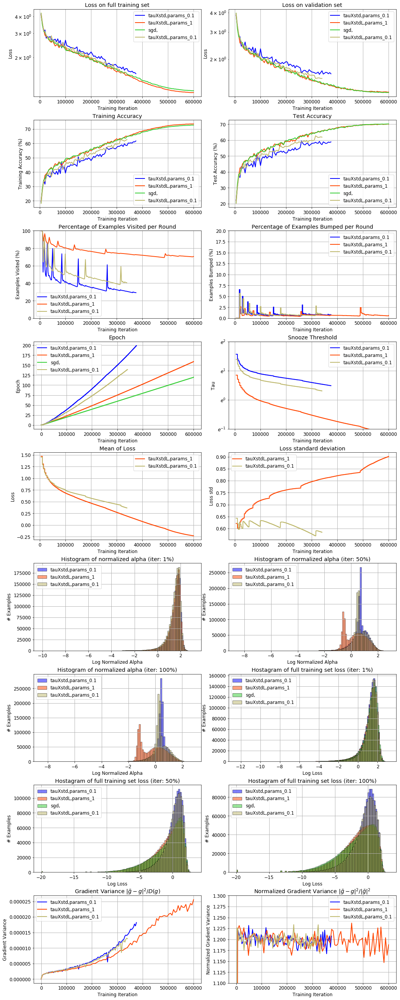

In [641]:
get_data_f = get_data_pth
plot_f = plt.plot
# plot_f = plot_smooth
logdir = '/u/faghri/dmom/code/runs/'
patterns = ['.*runs_imagenet_expsnooze_ad_hist_hparam_nonorm/']
tag_names = ['Tloss', 'Vloss', 'Tacc', 'Vacc', 'touch_p', 'bumped_p', 'epoch', 'tau', 'tauloss_mu', 'tauloss_std', 'alpha_normed_h_log_1', 'alpha_normed_h_log_50', 'alpha_normed_h_log_100', 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100', 'grad_var', 'grad_var_n']  # , 'visits_h', 'count_h']  , 'Tloss_h_log_1', 'Tloss_h_log_50', 'Tloss_h_log_100'
fig_name = 'figs_expsnooze/imagenet_expsnooze_ad_hist_hparam_nonorm.png'
# lg_tags = ['sgd', 'w2c_', 'params_'] # params_0.1|.*params_0.001
lg_tags = ['sgd', 'tau', 'params_']  # 'w2c_', , 'params_.......', '/.._', 
ylim = [None, None, None, None, [0, 100], [0, 20], None, [np.exp(-1), np.exp(2)], None, None, None, None, None, None, None, None, None, [1.1, 1.3]]
sep_h = False
data, run_names = plot_runs_and_tags(get_data_f, plot_f, logdir, patterns, tag_names, fig_name, lg_tags, ylim, sep_h=sep_h)

In [626]:
data[2]['Vacc'][:,-1]

array([6.0060e+05, 7.0176e+01])